In [34]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from scipy import misc
import cv2

%matplotlib inline
plt.rcParams['figure.figsize'] = (20.0, 20.0) # set default size of plots

## Read input data

In [2]:
%ls ../input

sample_submission.csv       train_photo_to_biz_ids.csv
test_photo_to_biz.csv       train_photos/
train.csv


In [3]:
train_photo_to_biz_ids = pd.read_csv('../input/train_photo_to_biz_ids.csv')

In [8]:
biz_id_to_photos = {k: g["photo_id"].tolist() for k,g in train_photo_to_biz_ids.groupby("business_id")}

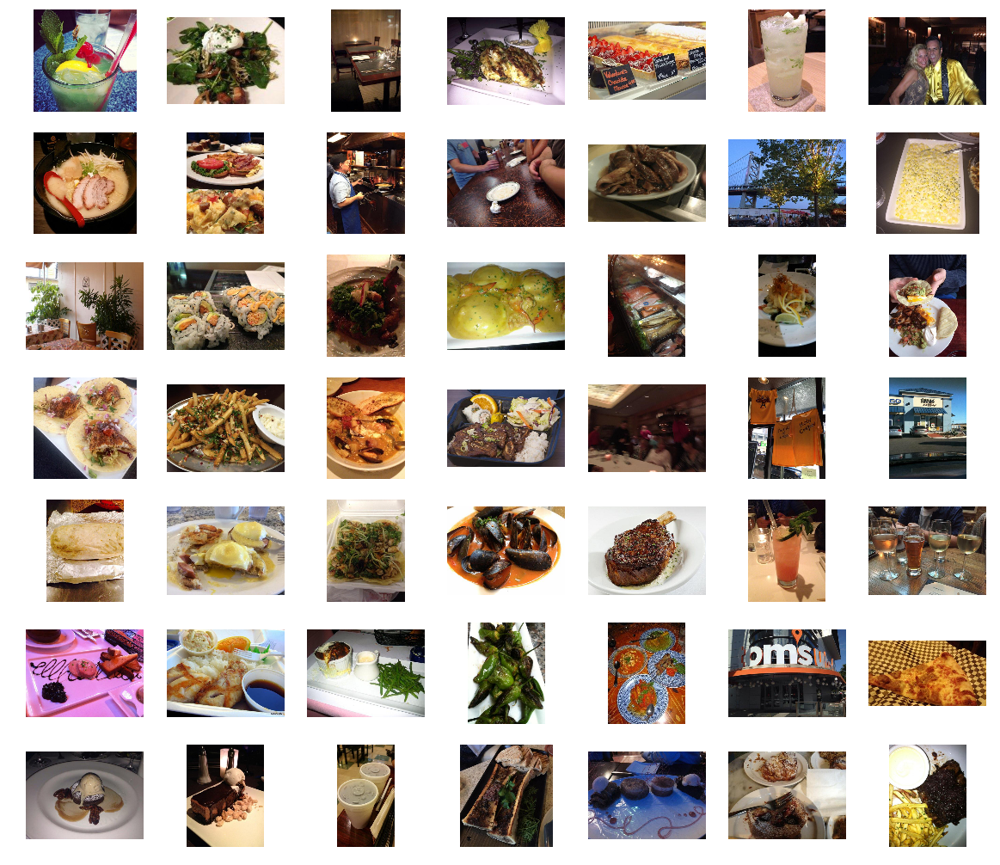

In [62]:
num_samples = 49
for idx, img_id in enumerate(train_photo_to_biz_ids.photo_id[np.random.randint(0, len(train_photo_to_biz_ids), num_samples)]):
    img = misc.imread(os.path.join('../input','train_photos', str(img_id)+".jpg"))
    plt.subplot(np.sqrt(num_samples)+1, np.sqrt(num_samples), idx+1)
    plt.axis('off')
    plt.imshow(img)

In [9]:
restaurant_attributes = {0: "good_for_lunch",
1: "good_for_dinner",
2: "takes_reservations",
3: "outdoor_seating",
4: "restaurant_is_expensive",
5: "has_alcohol",
6: "has_table_service",
7: "ambience_is_classy",
8: "good_for_kids",}

biz_id_to_attribs = pd.read_csv('../input/train.csv')
for attrib_key,attrib in restaurant_attributes.iteritems():
    biz_id_to_attribs[attrib] = biz_id_to_attribs['labels'].str.contains(str(attrib_key))

In [10]:
biz_id_to_attribs.head()

,business_id,labels,good_for_lunch,good_for_dinner,takes_reservations,outdoor_seating,restaurant_is_expensive,has_alcohol,has_table_service,ambience_is_classy,good_for_kids
0,1000,1 2 3 4 5 6 7,False,True,True,True,True,True,True,True,False
1,1001,0 1 6 8,True,True,False,False,False,False,True,False,True
2,100,1 2 4 5 6 7,False,True,True,False,True,True,True,True,False
3,1006,1 2 4 5 6,False,True,True,False,True,True,True,False,False
4,1010,0 6 8,True,False,False,False,False,False,True,False,True


## Pre-process images

In [62]:
def readImage(img_id, vgg_compatible_input=True, preprocess=False):
    img = misc.imread(os.path.join('../input','train_photos', str(img_id)+".jpg"))
    
    if preprocess:
        img = cv2.resize(img, (224, 224)).astype(np.float32)
        img[:,:,0] -= 103.939
        img[:,:,1] -= 116.779
        img[:,:,2] -= 123.68
        
    if vgg_compatible_input:
        img = img.transpose((2,0,1))
        img = np.expand_dims(img, axis=0)
        
    return img

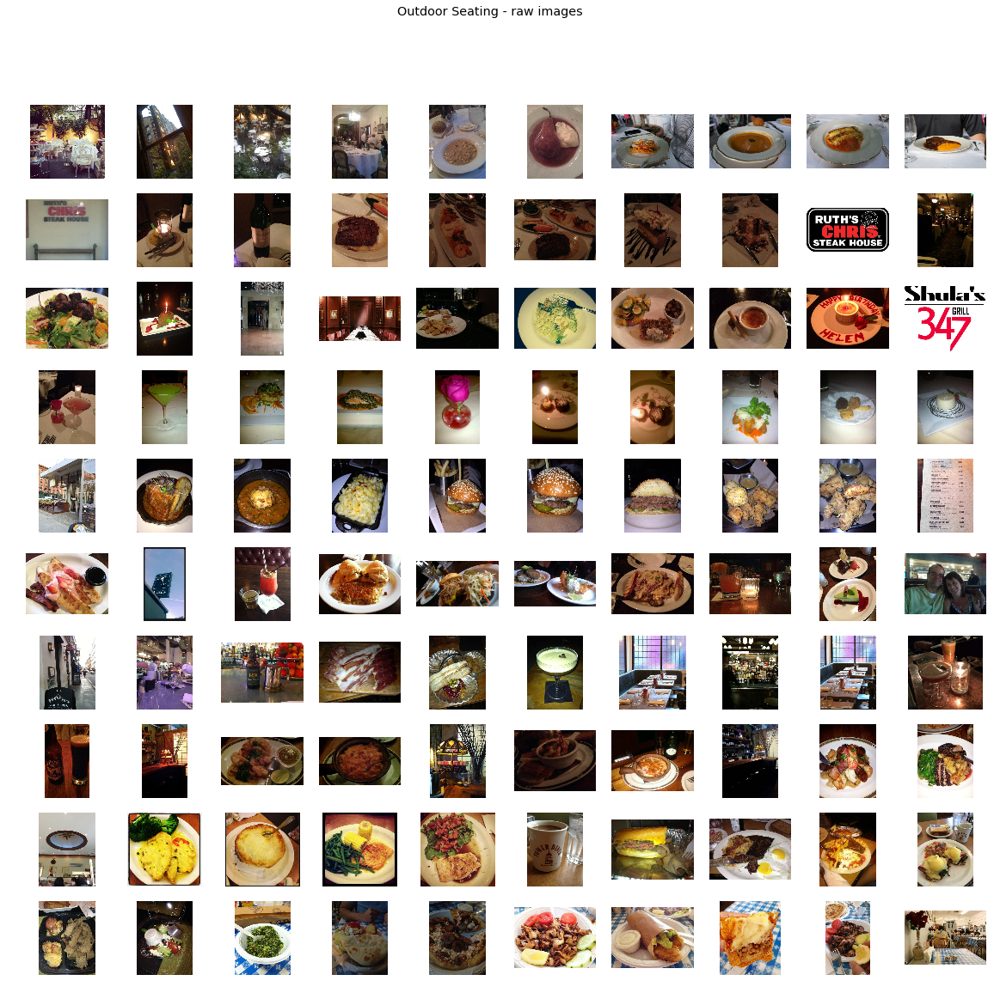

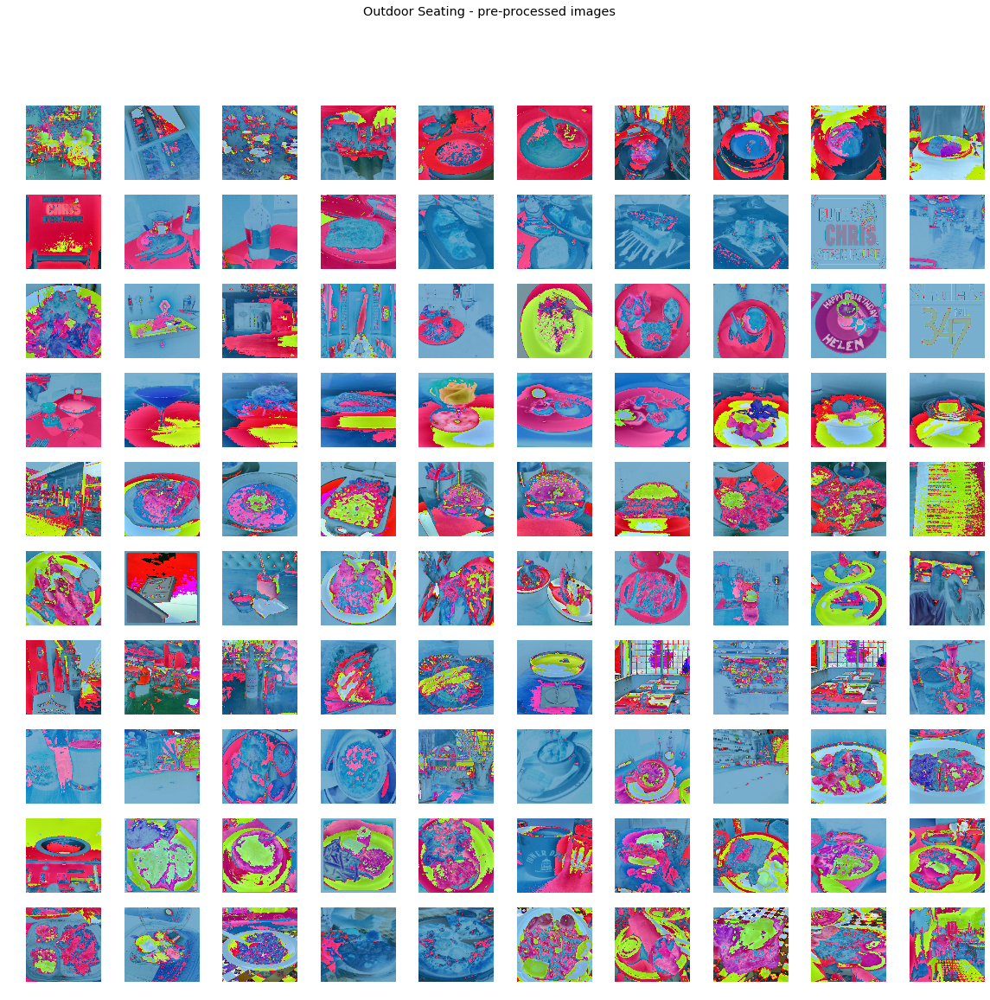

In [70]:
has_alcohol_places = biz_id_to_attribs[biz_id_to_attribs['has_alcohol'] == True]['business_id']
max_biz, max_biz_photos = 10, 10
fig = plt.figure(1)
st = fig.suptitle("Outdoor Seating - raw images", fontsize="x-large")
for i, biz_id in enumerate(has_alcohol_places.to_dict().values()[:max_biz]): # iterate over business with attrib has_alcohol
    for j in range(min(len(biz_id_to_photos[biz_id]),max_biz_photos)): # iterate over all photos of that particular business 
        plt.subplot(max_biz+1,max_biz_photos,i*max_biz_photos+j+1)
        plt.axis("off")
        plt.imshow(readImage(biz_id_to_photos[biz_id][j], vgg_compatible_input=False, preprocess=False))
fig = plt.figure(2)
st = fig.suptitle("Outdoor Seating - pre-processed images", fontsize="x-large")
for i, biz_id in enumerate(has_alcohol_places.to_dict().values()[:max_biz]):
    for j in range(min(len(biz_id_to_photos[biz_id]),max_biz_photos)):
        plt.subplot(max_biz+1,max_biz_photos,i*max_biz_photos+j+1)
        plt.axis("off")
        plt.imshow(readImage(biz_id_to_photos[biz_id][j], vgg_compatible_input=True, preprocess=True)[0].transpose(1,2,0))

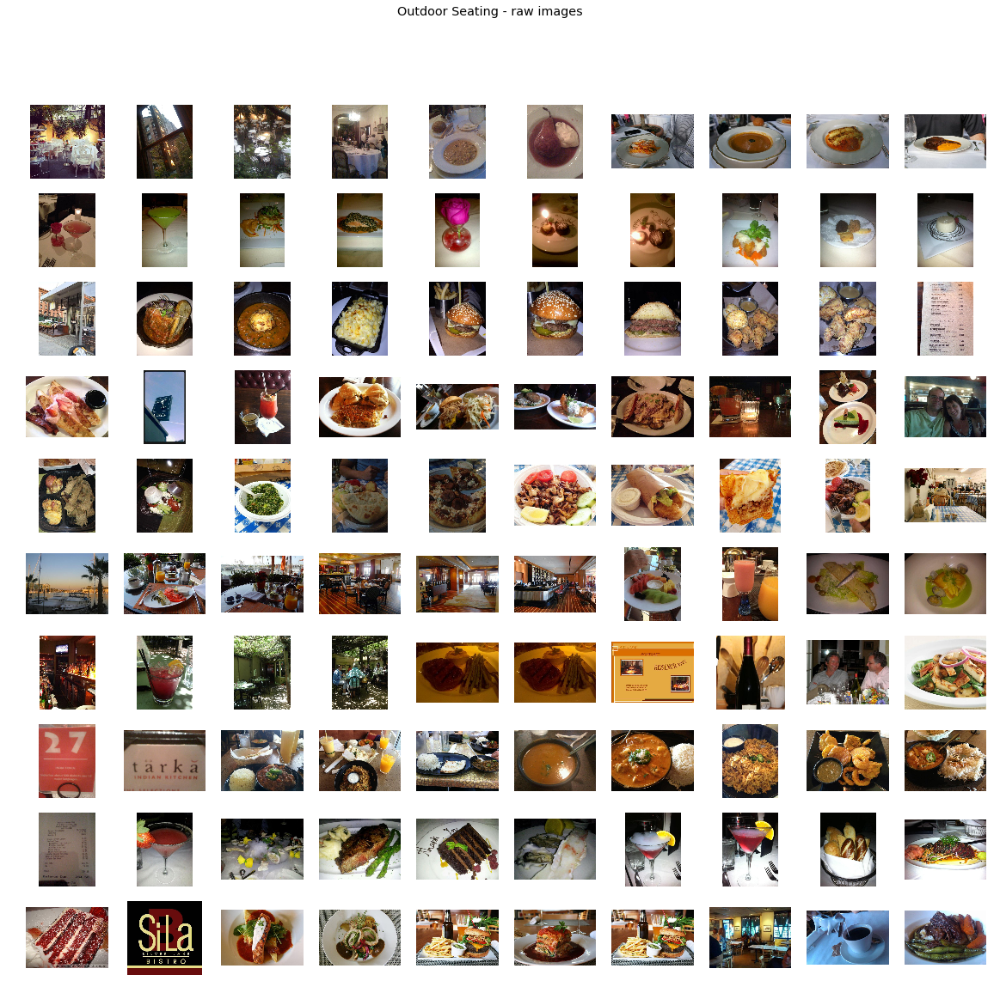

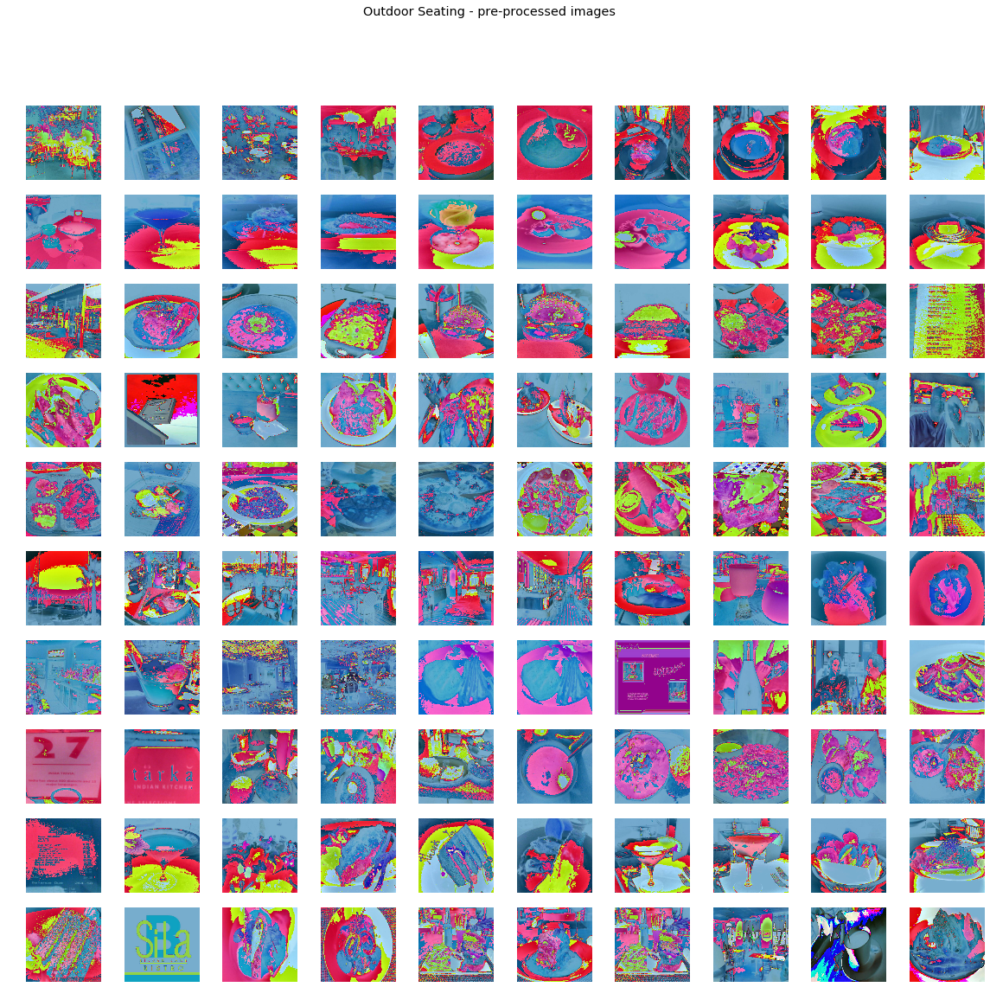

In [71]:
outdoor_seating_places = biz_id_to_attribs[biz_id_to_attribs['outdoor_seating'] == True]['business_id']
max_biz, max_biz_photos = 10, 10
fig = plt.figure(1)
st = fig.suptitle("Outdoor Seating - raw images", fontsize="x-large")
for i, biz_id in enumerate(outdoor_seating_places.to_dict().values()[:max_biz]): # iterate over business with attrib has_alcohol
    for j in range(min(len(biz_id_to_photos[biz_id]),max_biz_photos)): # iterate over all photos of that particular business 
        plt.subplot(max_biz+1,max_biz_photos,i*max_biz_photos+j+1)
        plt.axis("off")
        plt.imshow(readImage(biz_id_to_photos[biz_id][j], vgg_compatible_input=False, preprocess=False))
fig = plt.figure(2)
st = fig.suptitle("Outdoor Seating - pre-processed images", fontsize="x-large")
for i, biz_id in enumerate(outdoor_seating_places.to_dict().values()[:max_biz]):
    for j in range(min(len(biz_id_to_photos[biz_id]),max_biz_photos)):
        plt.subplot(max_biz+1,max_biz_photos,i*max_biz_photos+j+1)
        plt.axis("off")
        plt.imshow(readImage(biz_id_to_photos[biz_id][j], vgg_compatible_input=True, preprocess=True)[0].transpose(1,2,0))